# Inspect `caribou_hi` results for TIGRESS-NCR Sightlines
Trey V. Wenger - October 2024

Visualize `caribou_hi` results and compres to TIGRESS-NCR physics.

TODO: compare to TIGRESS table volume + mass filling factors

## Load Synthetic Data

In [1]:
import pickle

resultsdir = "/media/drive1/tigress_ncr_results/R8_4pc"

synth_data = {"matched": {}, "mismatched": {}}

fwhms = [1, 3, 10]
for key in synth_data.keys():
    for fwhm in fwhms:
        print(key, fwhm)
        with open(f"{resultsdir}/HI_{key}_spectra_{fwhm}pix.pkl", "rb") as f:
            synth_data[key][fwhm] = pickle.load(f)

matched 1
matched 3
matched 10
mismatched 1
mismatched 3
mismatched 10


## Load TIGRESS-NCR sightline data

In [2]:
with open(f"{resultsdir}/tigress_tigress_results.pkl", "rb") as f:
    tigress_results = pickle.load(f)

## Load `caribou_hi` results

In [ ]:
import pickle
import os
import glob
from tqdm.notebook import tqdm
import warnings

from scripts import analysis_utils
import importlib
importlib.reload(analysis_utils)

caribou_hi_results = {"matched": {}, "mismatched": {}}
fwhms = [1, 3, 10]
for key in synth_data.keys():
    for fwhm in fwhms:
        print(key, fwhm)
        caribou_hi_results[key][fwhm] = {}
        
        pbar = tqdm(total=len(synth_data[key][fwhm]["location"]))
        for idx in range(len(synth_data[key][fwhm]["location"])):
            fname = f"{resultsdir}/HI_{key}_spectra_{fwhm}pix/{idx}_caribou_hi.pkl"
            if not os.path.exists(fname):
                print(f"{fname} not found!")
                continue
            with warnings.catch_warnings(action="ignore"):
                caribou_hi_results[key][fwhm][idx] = analysis_utils.compile_caribou_results(
                    fname, synth_data[key][fwhm]['x_values'][idx], synth_data[key][fwhm]['x_values_em'][idx],
                    predict=True, condition_ff=False, thin=10,
                )
            pbar.update()

with open(f"{resultsdir}/caribou_tigress_results.pkl", "wb") as f:
    pickle.dump(caribou_hi_results, f)

In [3]:
with open(f"{resultsdir}/caribou_tigress_results.pkl", "rb") as f:
    caribou_hi_results = pickle.load(f)

## Number of cloud components

analysis_plots version 0.1
analysis_plots version 0.1


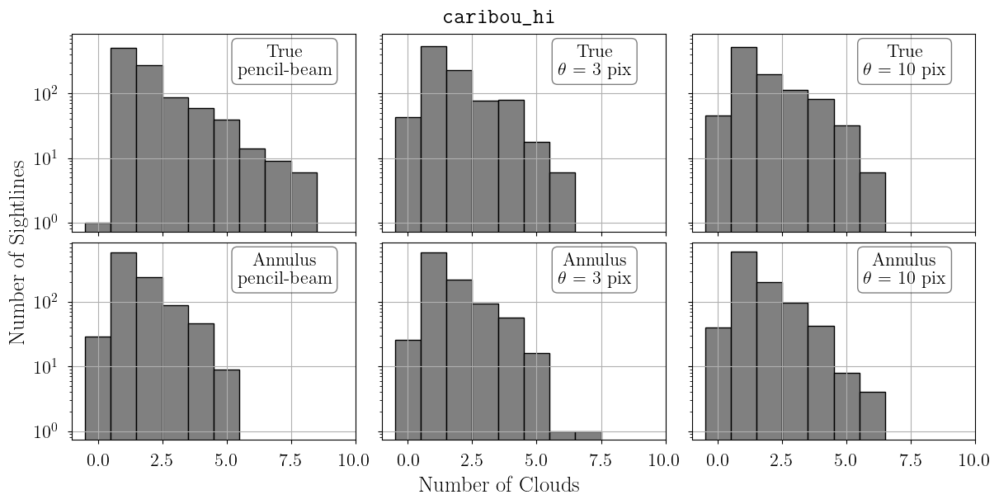

In [4]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

import numpy as np

bins = np.arange(-0.5, 10.5, 1.0)
fig = analysis_plots.plot_grid(
    analysis_plots.Histogram,
    "num_clouds",
    [caribou_hi_results],
    ["caribou_hi"],
    xlabel="Number of Clouds",
    ylabel="Number of Sightlines",
    title=r"\texttt{caribou_hi}",
    bins=bins,
    yscale="log",
    equal_line=False,
)

## Filter Results

`caribou_hi` sometimes converges to non-physical solutions. This happens for WNM only sightlines where `caribou_hi` happily makes a large, cold cloud with low absorption weight. Here we drop these solutions from the analysis.

In [5]:
bad_caribou_sightlines = {"matched": {}, "mismatched": {}}

for key in ["matched", "mismatched"]:
    for fwhm in [1, 3, 10]:
        print(key, fwhm)
        no_gauss = [
            idx for idx, result in caribou_hi_results[key][fwhm].items()
            if result["median"]["n_gauss"] == 0
        ]
        print(f"{len(no_gauss)} sightlines with 0 clouds")
        bad_bic = [
            idx for idx, result in caribou_hi_results[key][fwhm].items()
            if result["median"]["BIC"] > 0
        ]
        print(f"{len(bad_bic)} sightlines with bad BIC")
        bad_results = [
            idx for idx, result in caribou_hi_results[key][fwhm].items()
            if len(result["median"]["absorption_weight"]) > 0 and np.any(
                (np.array(result["median"]["absorption_weight"]) < 0.1)*
                (np.array(result["median"]["log10_tkin"]) < 2.5)
            )
        ]
        print(f"{len(bad_results)} sightlines with bad results")
        bad_caribou_sightlines[key][fwhm] = list(set(no_gauss + bad_bic + bad_results))
        print(f"Dropping {len(bad_caribou_sightlines[key][fwhm])} bad sightlines")
        print(f"{len(tigress_results[1]) - len(bad_caribou_sightlines[key][fwhm])} sightlines remain")
        print()

matched 1
29 sightlines with 0 clouds
33 sightlines with bad BIC
78 sightlines with bad results
Dropping 107 bad sightlines
893 sightlines remain

matched 3
26 sightlines with 0 clouds
35 sightlines with bad BIC
104 sightlines with bad results
Dropping 132 bad sightlines
868 sightlines remain

matched 10
40 sightlines with 0 clouds
55 sightlines with bad BIC
97 sightlines with bad results
Dropping 138 bad sightlines
862 sightlines remain

mismatched 1
1 sightlines with 0 clouds
10 sightlines with bad BIC
0 sightlines with bad results
Dropping 10 bad sightlines
990 sightlines remain

mismatched 3
43 sightlines with 0 clouds
54 sightlines with bad BIC
105 sightlines with bad results
Dropping 155 bad sightlines
845 sightlines remain

mismatched 10
45 sightlines with 0 clouds
56 sightlines with bad BIC
142 sightlines with bad results
Dropping 191 bad sightlines
809 sightlines remain



## Sightline results

analysis_plots version 0.1


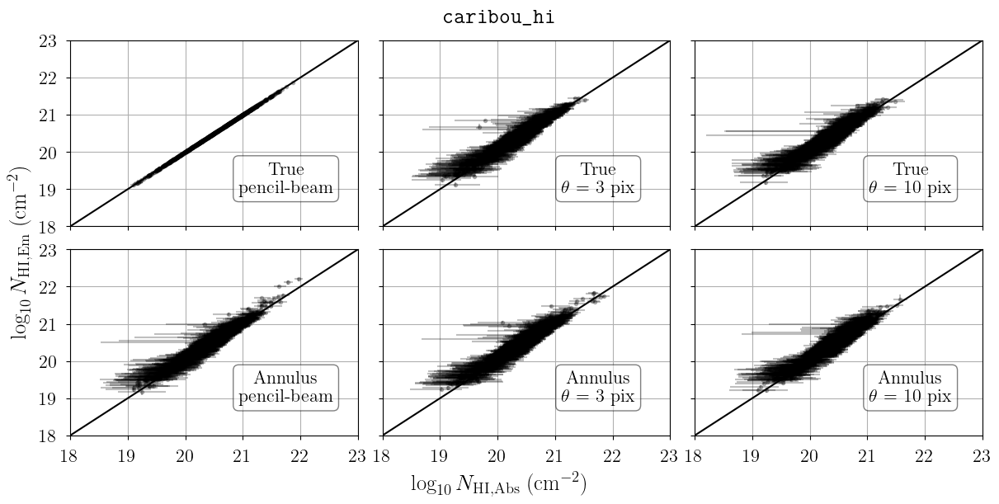

In [6]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_tau", "All_log10_NHI_TB"],
    equal_line=True,
    label_loc="lower right",
    xlim=(18.0, 23.0),
    ylim=(18.0, 23.0),
    drop_sightlines=bad_caribou_sightlines,
)

## CNM Fraction

analysis_plots version 0.1


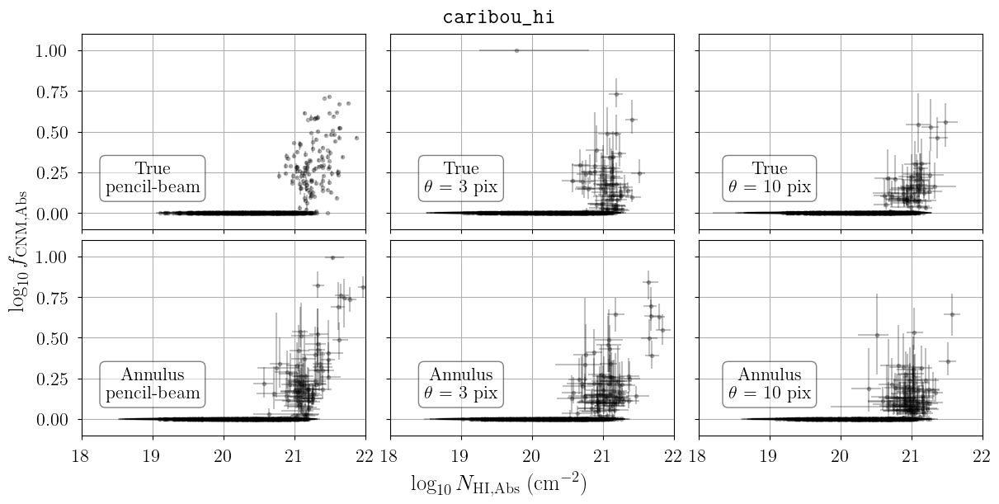

In [9]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} f_{\rm CNM, Abs}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_tau", "CNM_fraction_tau"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


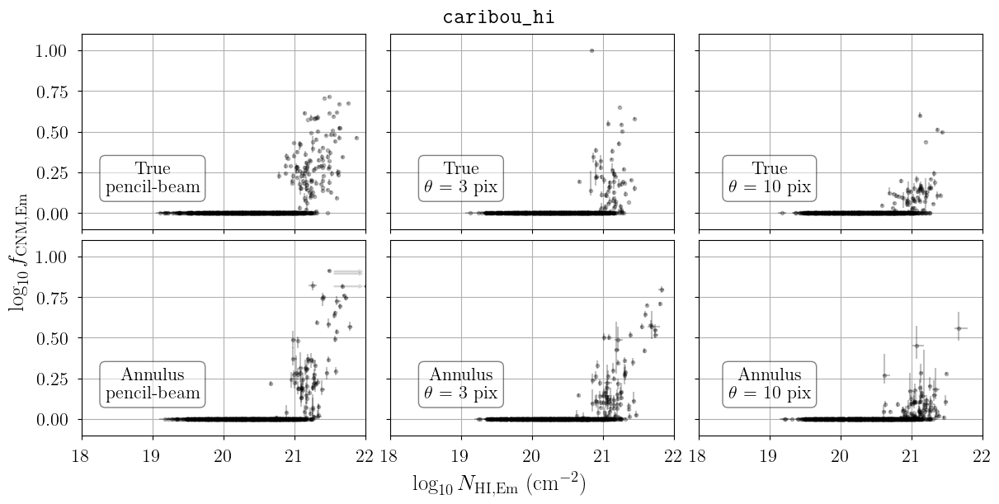

In [11]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} f_{\rm CNM, Em}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_TB", "CNM_fraction_TB"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


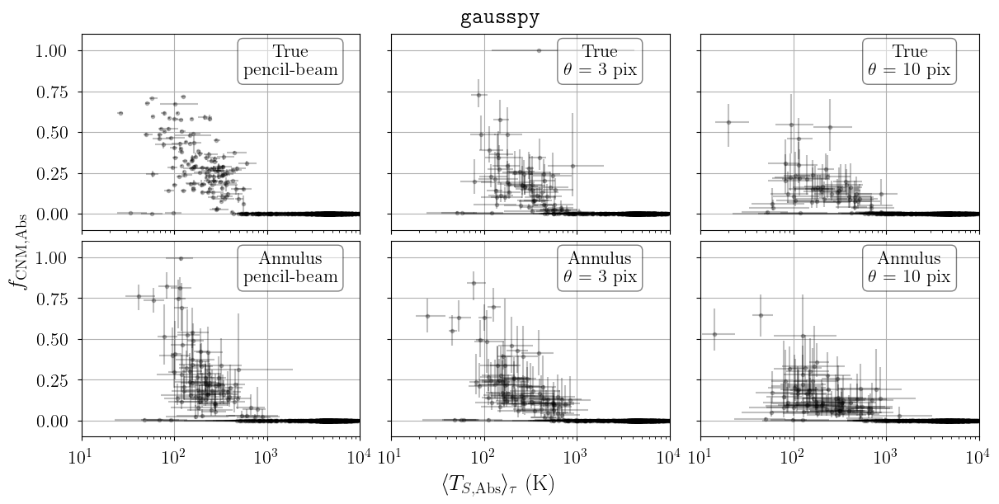

In [14]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_tau", "CNM_fraction_tau"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Abs}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm CNM, Abs}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


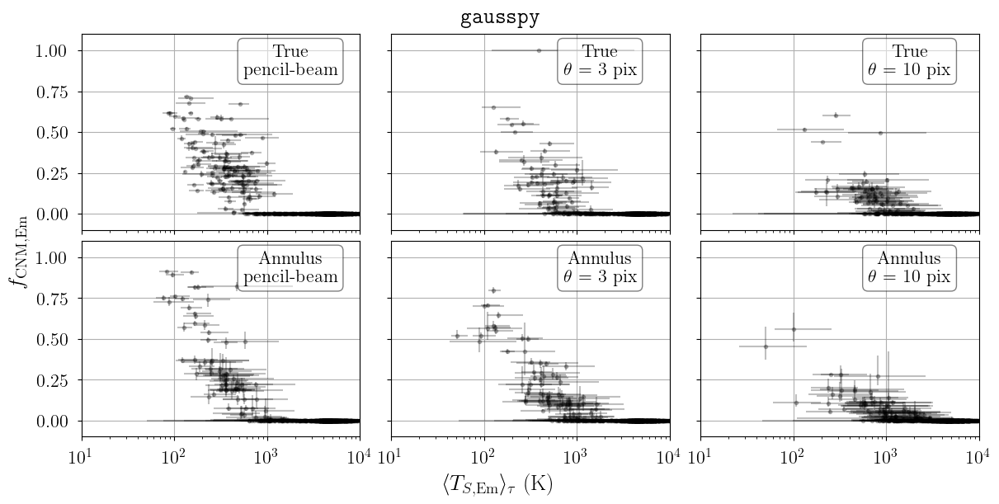

In [15]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_TB", "CNM_fraction_TB"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Em}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm CNM, Em}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

## LNM Fraction

analysis_plots version 0.1


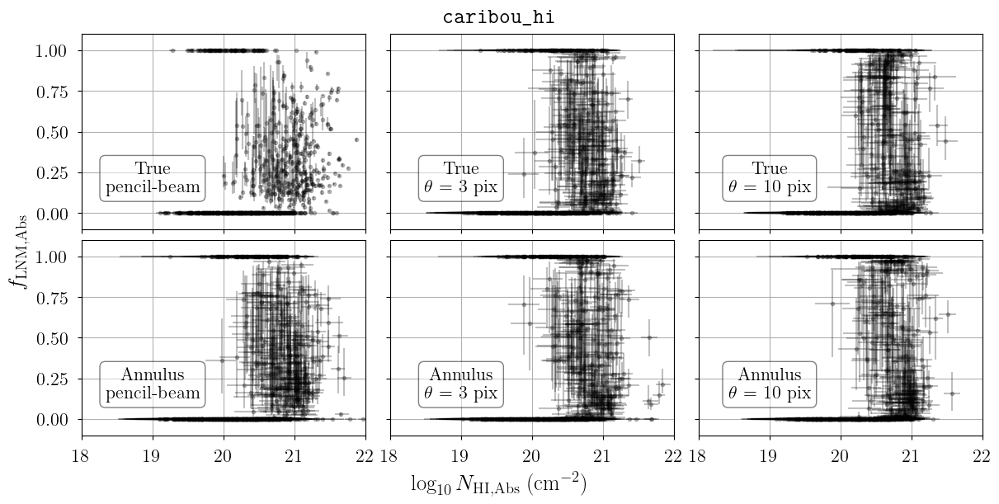

In [16]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    ylabel=r"$f_{\rm LNM, Abs}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_tau", "LNM_fraction_tau"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


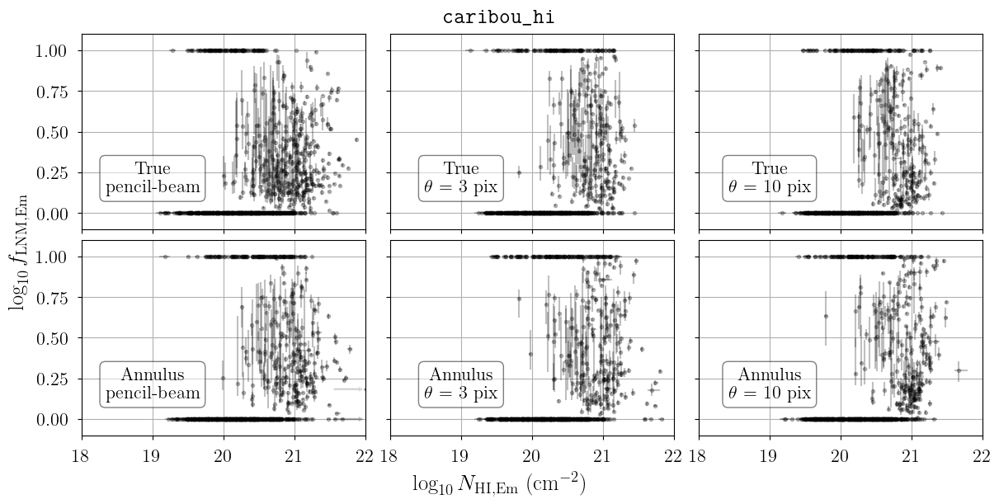

In [17]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} f_{\rm LNM, Em}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_TB", "LNM_fraction_TB"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


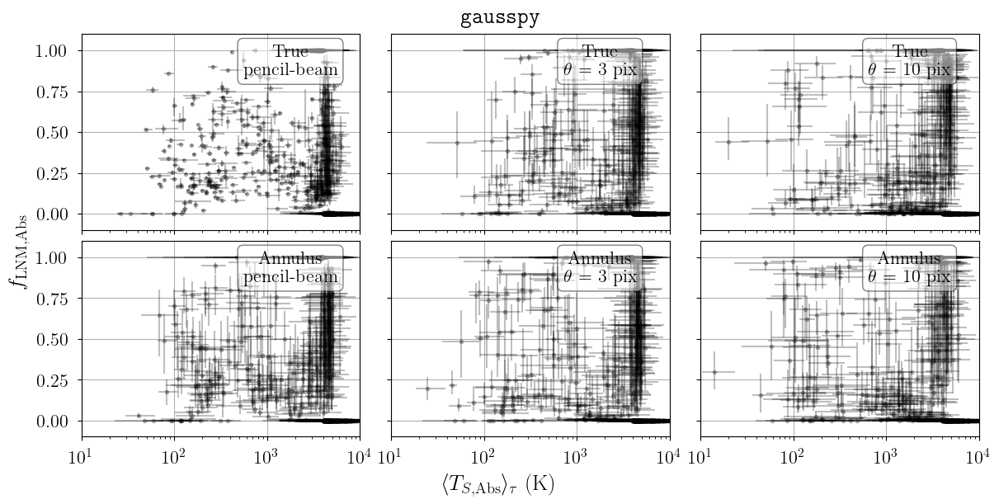

In [18]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_tau", "LNM_fraction_tau"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Abs}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm LNM, Abs}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


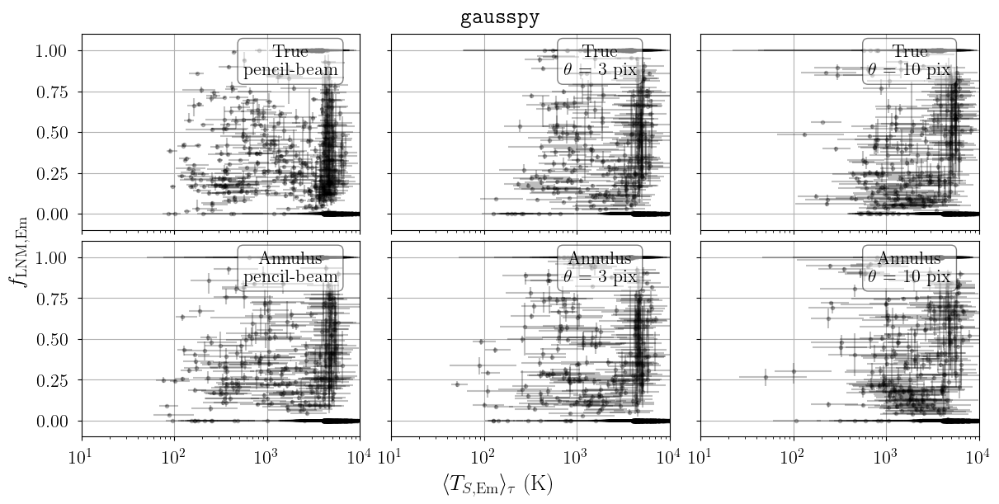

In [19]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_TB", "LNM_fraction_TB"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Em}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm LNM, Em}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

## WNM Fraction

analysis_plots version 0.1


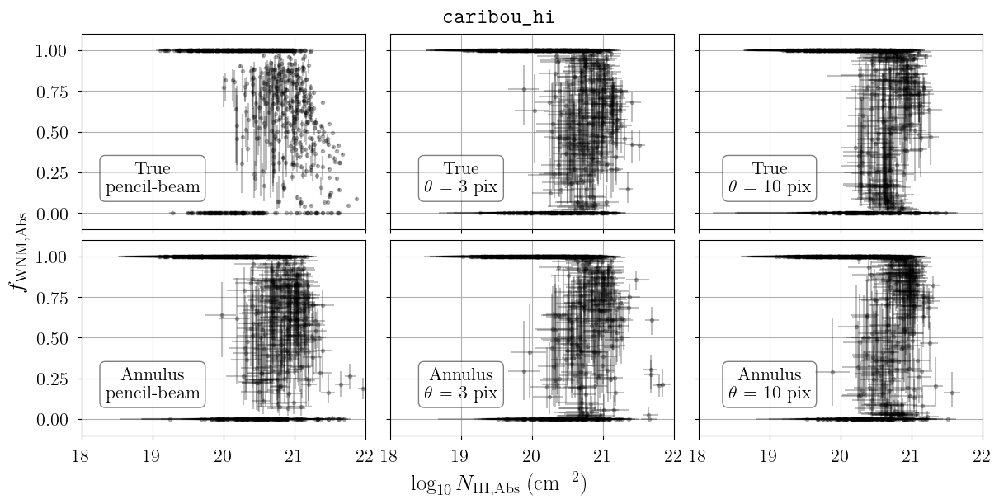

In [20]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    ylabel=r"$f_{\rm WNM, Abs}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_tau", "WNM_fraction_tau"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


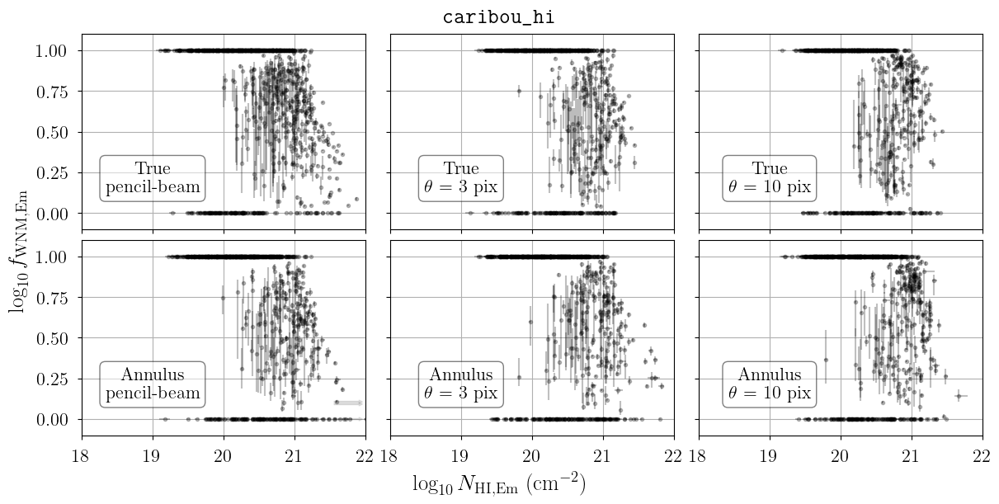

In [21]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} f_{\rm WNM, Em}$",
    title=r"\texttt{caribou_hi}",
    params=["All_log10_NHI_TB", "WNM_fraction_TB"],
    equal_line=True,
    label_loc="lower left",
    xlim=(18.0, 22.0),
    ylim=(-0.1, 1.1),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


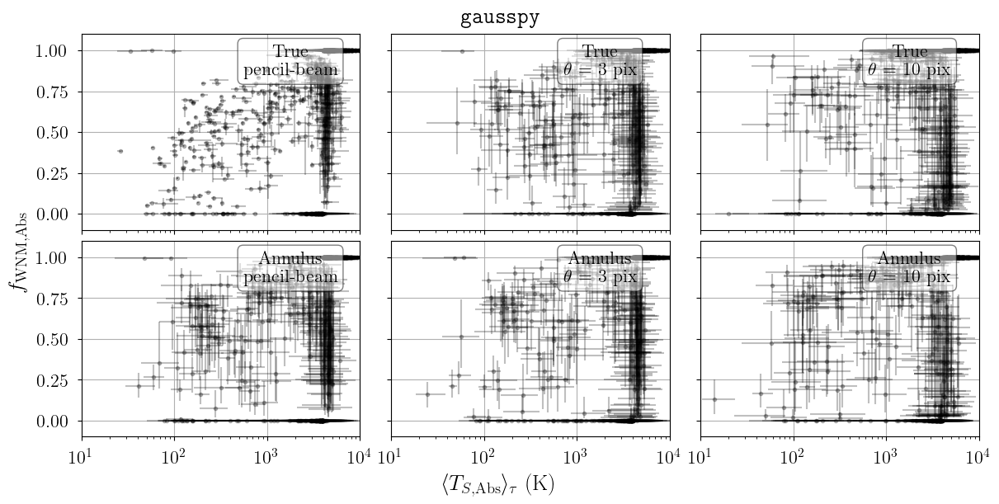

In [22]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_tau", "WNM_fraction_tau"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Abs}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm WNM, Abs}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


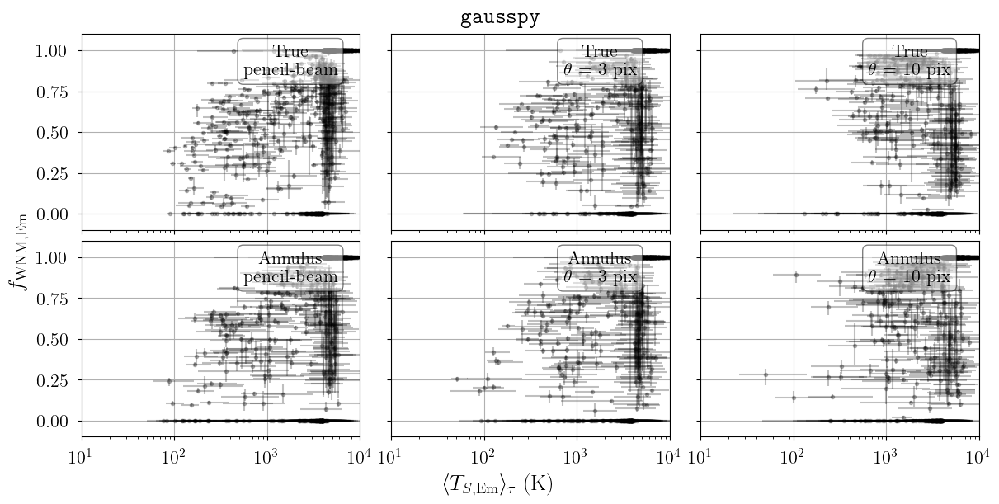

In [24]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["tau_weighted_tspin_TB", "WNM_fraction_TB"],
    num_bins=0,
    title=r"\texttt{gausspy}",
    xlabel=r"$\langle T_{S\rm, Em}\rangle_{\tau}$ (K)",
    ylabel=r"$f_{\rm WNM, Em}$",
    xlim=(10.0, 10000.0),
    ylim=(-0.1, 1.1),
    xscale="log",
    equal_line=False,
    label_loc="upper right",
    drop_sightlines=bad_caribou_sightlines,
)

## Cloud Solutions

analysis_plots version 0.1


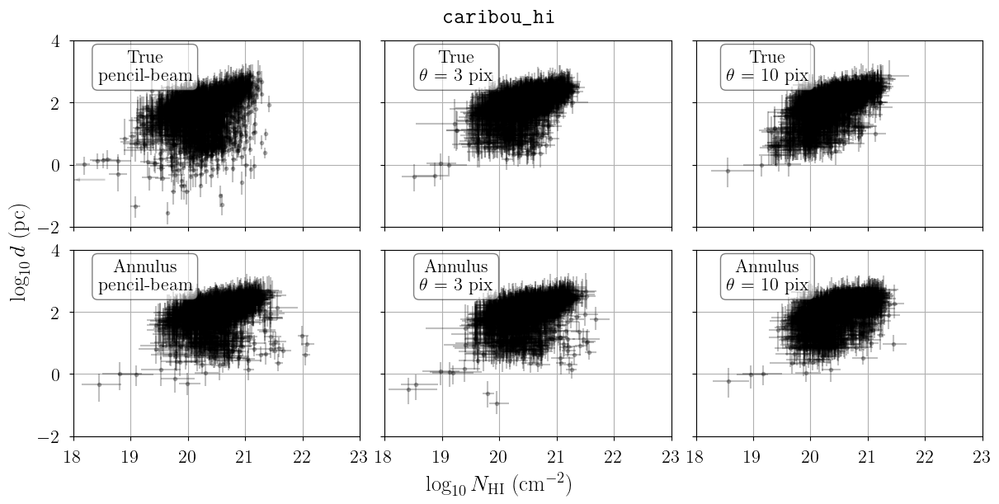

In [25]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} d$ (pc)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_depth"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(-2.0, 4.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


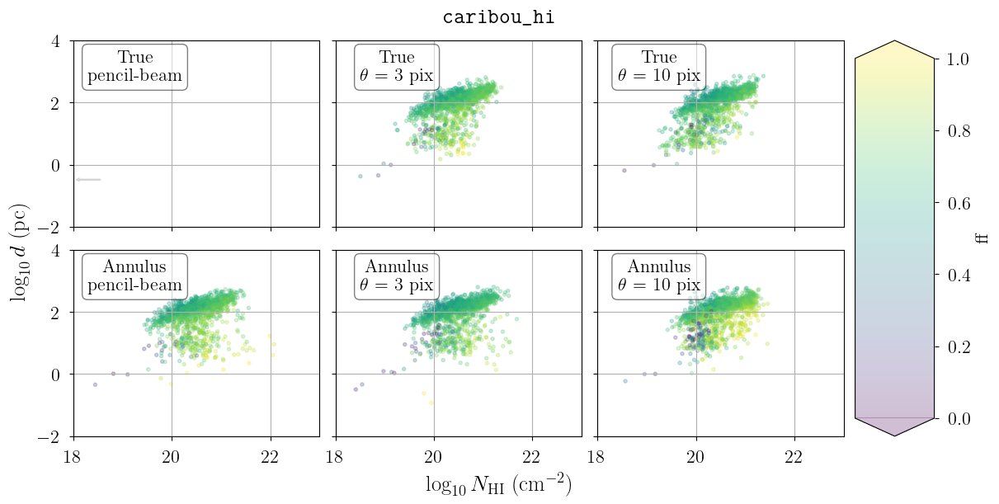

In [26]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} d$ (pc)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_depth"],
    color_param="filling_factor",
    cbar_label="ff",
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(-2.0, 4.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


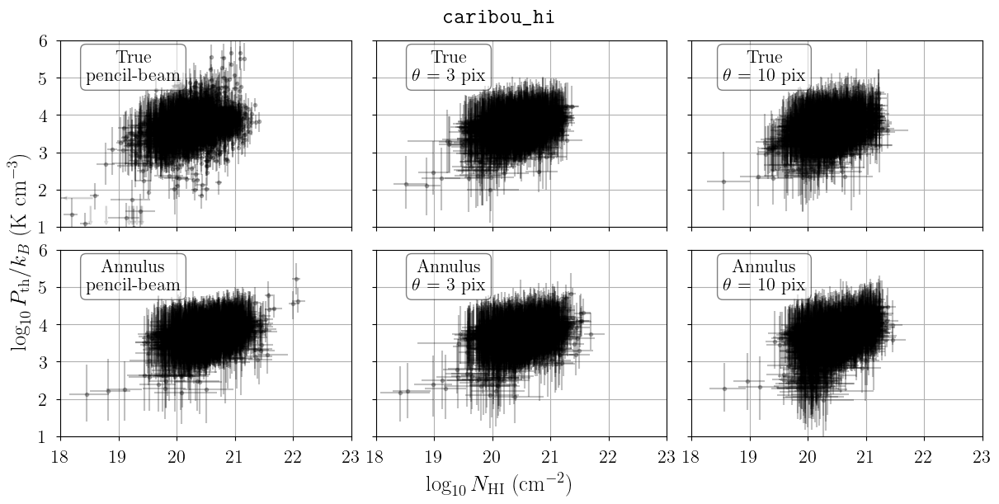

In [27]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_pressure"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(1.0, 6.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


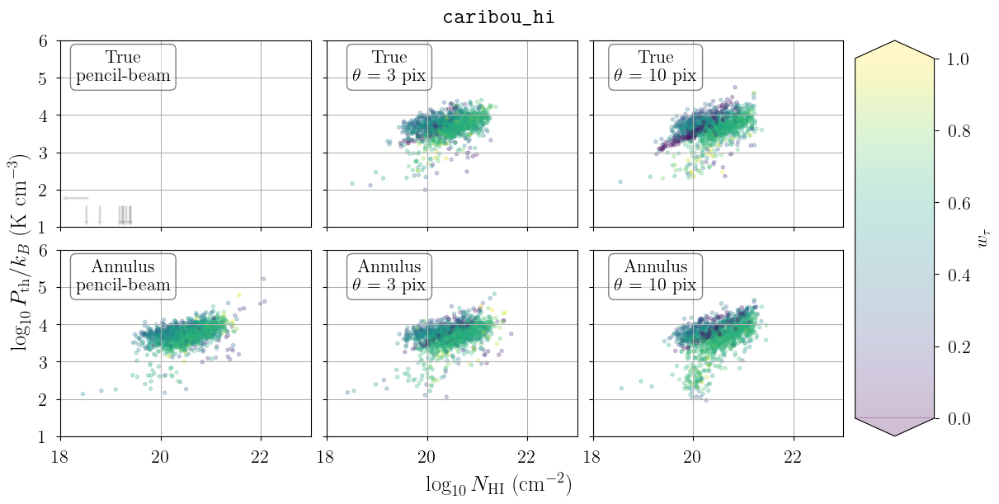

In [28]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_pressure"],
    color_param="absorption_weight",
    cbar_label=r"$w_\tau$",
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(1.0, 6.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


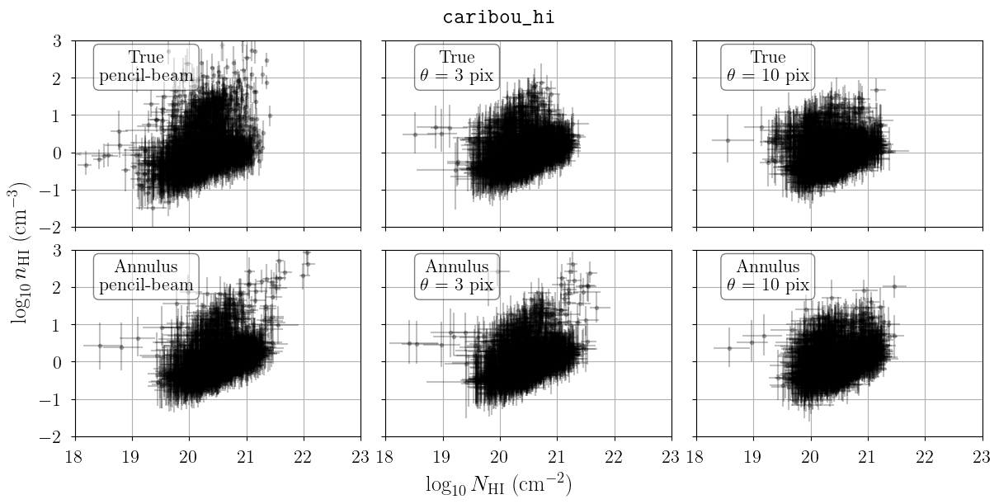

In [29]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_nHI"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(-2.0, 3.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


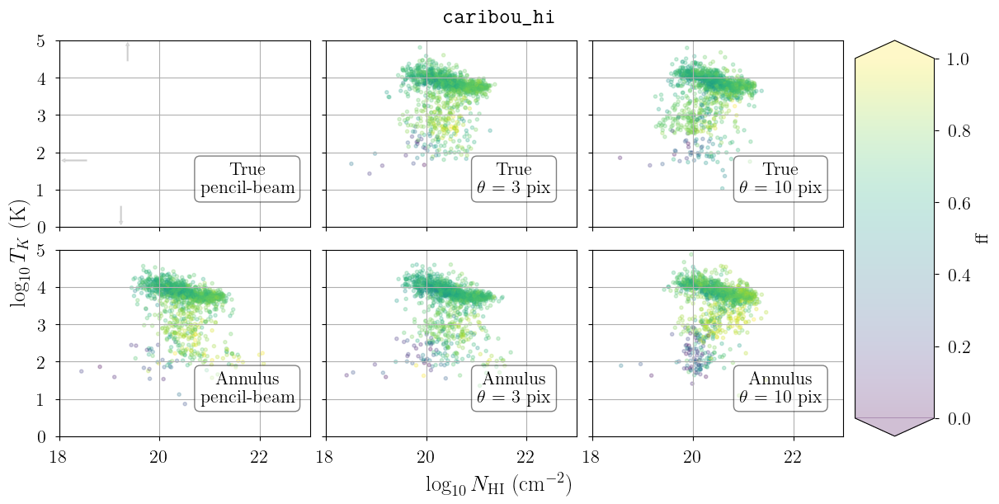

In [30]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} T_K$ (K)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_tkin"],
    color_param="filling_factor",
    cbar_label="ff",
    equal_line=False,
    label_loc="lower right",
    xlim=(18.0, 23.0),
    ylim=(0.0, 5.0),
    drop_sightlines=bad_caribou_sightlines,
)

The CNM tends to have a low filling factor. It is more likely to be detected in absorption than in emission.

analysis_plots version 0.1


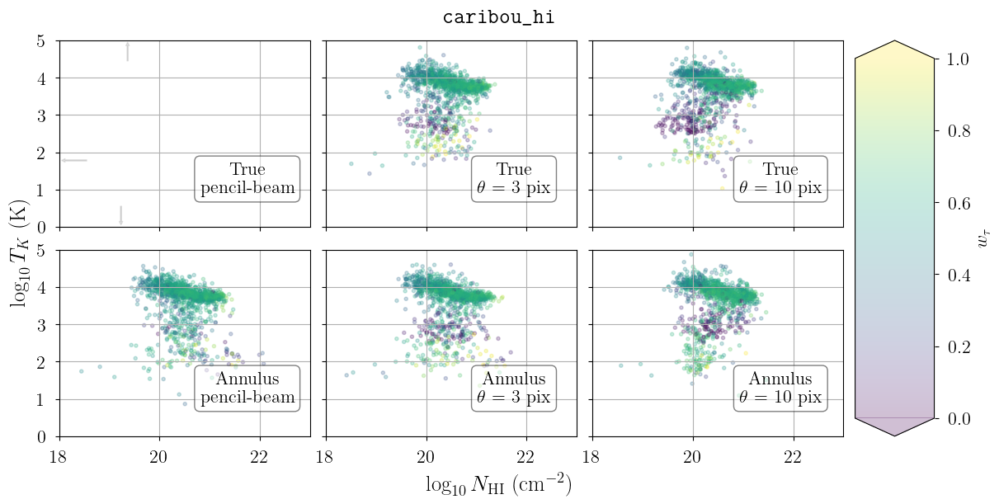

In [31]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\log_{10} T_K$ (K)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "log10_tkin"],
    color_param="absorption_weight",
    cbar_label=r"$w_\tau$",
    equal_line=False,
    label_loc="lower right",
    xlim=(18.0, 23.0),
    ylim=(0.0, 5.0),
    drop_sightlines=bad_caribou_sightlines,
)

It appears that the LNM tends to have lower absorption weights: it is more likely to be detected in emission and not in absorption.

analysis_plots version 0.1


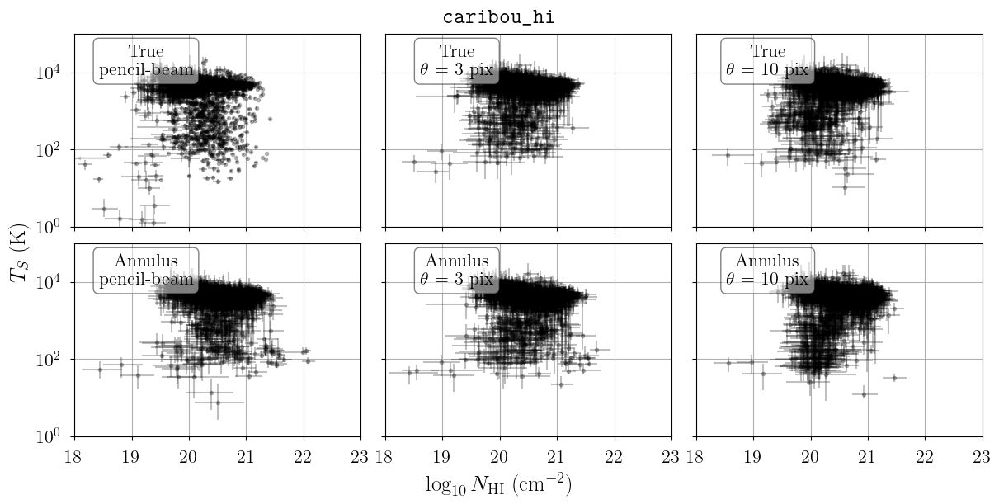

In [32]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$T_S$ (K)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "tspin"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(1.0, 100000.0),
    yscale="log",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


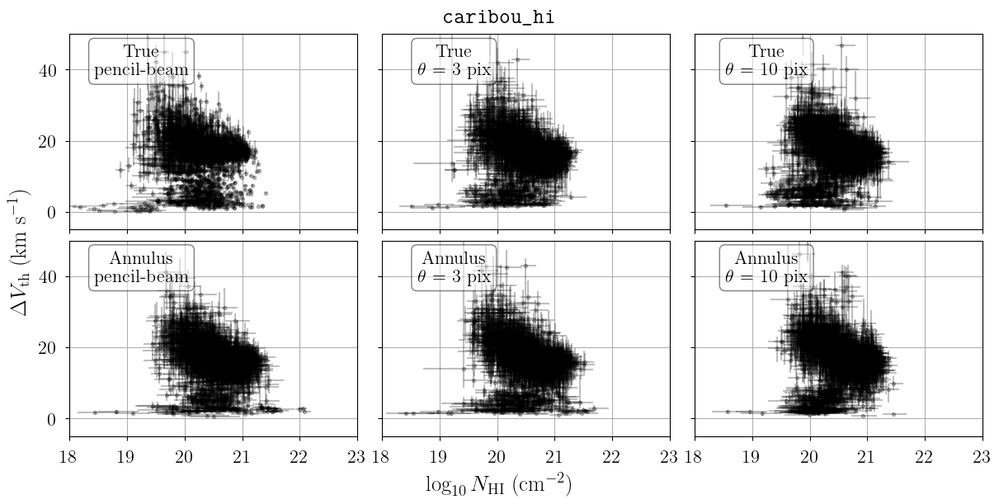

In [33]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\Delta V_{\rm th}$ (km s$^{-1}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "fwhm_thermal"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(-5.0, 50.0),
    #yscale="log",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


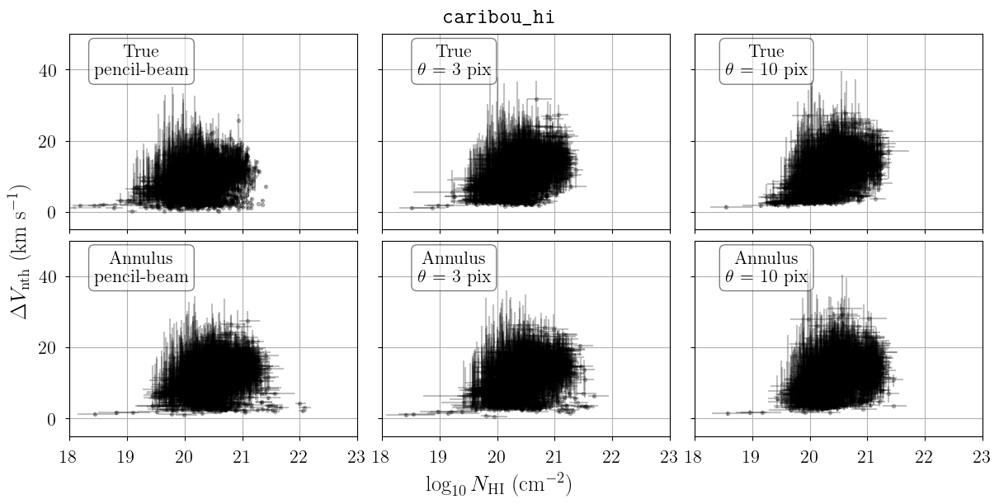

In [34]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} N_{\rm HI}$ (cm$^{-2}$)",
    ylabel=r"$\Delta V_{\rm nth}$ (km s$^{-1}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_NHI", "fwhm_nonthermal"],
    equal_line=False,
    label_loc="upper left",
    xlim=(18.0, 23.0),
    ylim=(-5.0, 50.0),
    #yscale="log",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


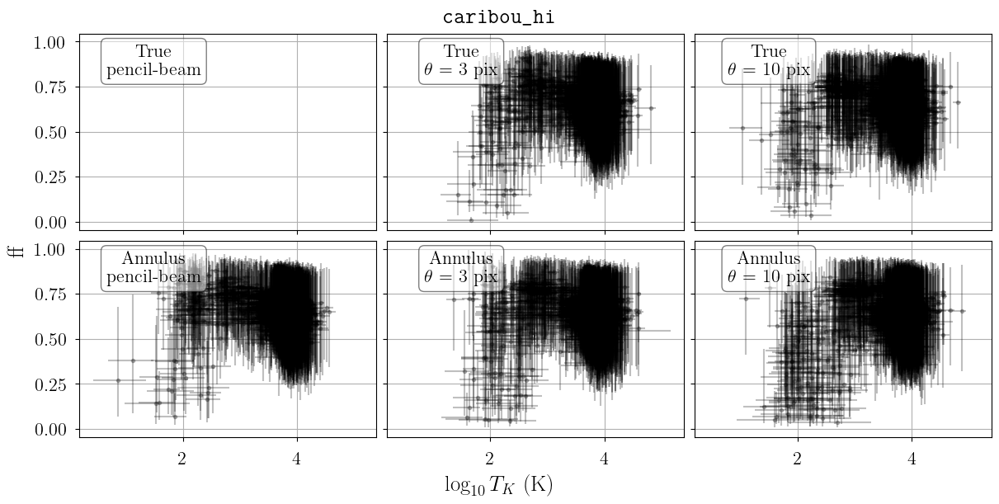

In [35]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} T_{K}$ (K)",
    ylabel=r"ff",
    title=r"\texttt{caribou_hi}",
    params=["log10_tkin", "filling_factor"],
    equal_line=False,
    label_loc="upper left",
    #xlim=(18.0, 23.0),
    #ylim=(-2.0, 4.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


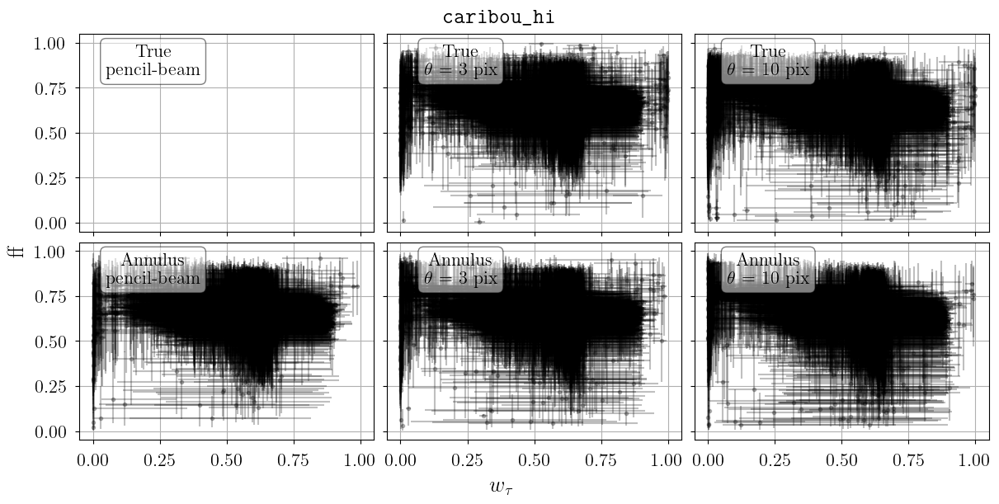

In [36]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$w_\tau$",
    ylabel=r"ff",
    title=r"\texttt{caribou_hi}",
    params=["absorption_weight", "filling_factor"],
    equal_line=False,
    label_loc="upper left",
    #xlim=(18.0, 23.0),
    #ylim=(-2.0, 4.0),
    #drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


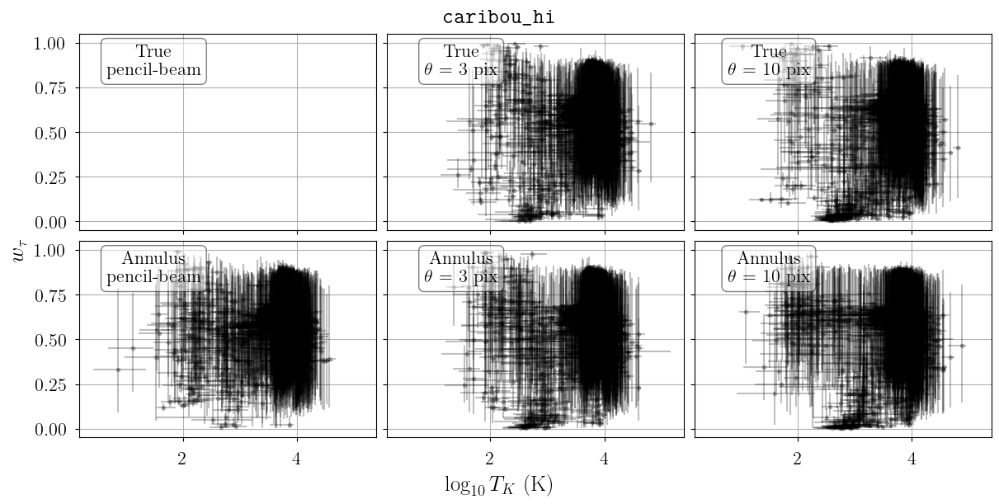

In [37]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} T_{K}$ (K)",
    ylabel=r"$w_\tau$",
    title=r"\texttt{caribou_hi}",
    params=["log10_tkin", "absorption_weight"],
    equal_line=False,
    label_loc="upper left",
    #xlim=(18.0, 23.0),
    #ylim=(-2.0, 4.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


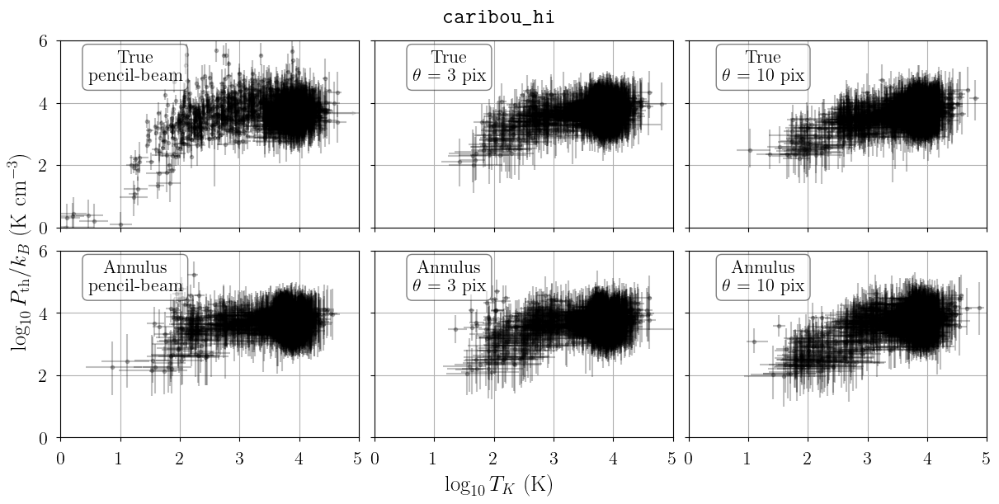

In [38]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} T_K$ (K)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_tkin", "log10_pressure"],
    equal_line=False,
    label_loc="upper left",
    xlim=(0.0, 5.0),
    ylim=(0.0, 6.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


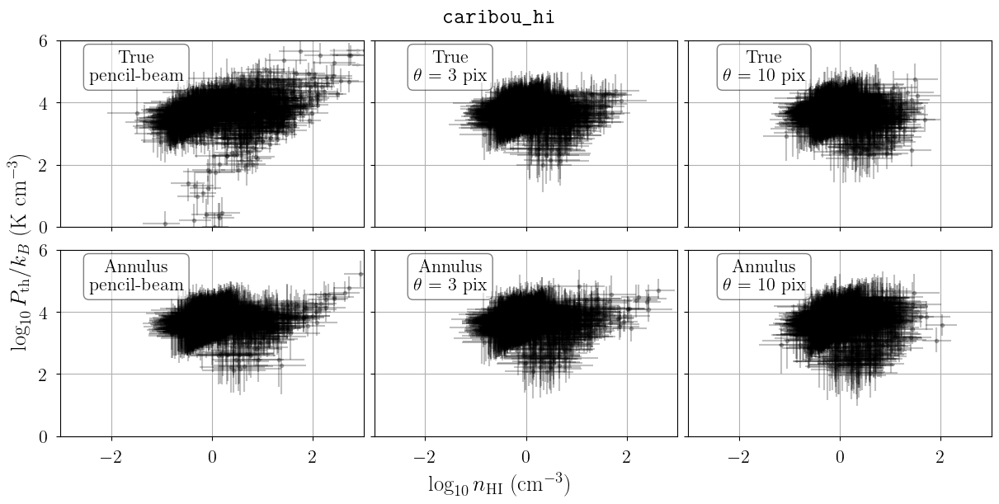

In [39]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    xlabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    title=r"\texttt{caribou_hi}",
    params=["log10_nHI", "log10_pressure"],
    equal_line=False,
    label_loc="upper left",
    xlim=(-3.0, 3.0),
    ylim=(0.0, 6.0),
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


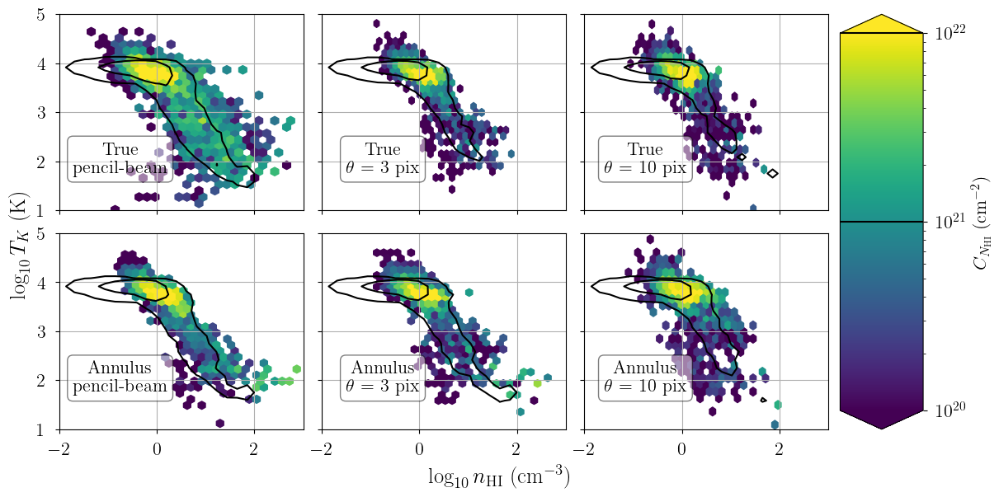

In [40]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative2D,
    "parameter",
    [caribou_hi_results, tigress_results],
    ["caribou_hi", "tigress"],
    params = ["log10_nHI_tau", "log10_tkin_tau"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    ylabel=r"$\log_{10} T_K$ (K)",
    xlim=(-2.0, 3.0),
    ylim=(1.0, 5.0),
    equal_line=False,
    volume=False,
    label_loc="lower left",
    cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    vmin=1.0e20,
    vmax=1.0e22,
    drop_sightlines=bad_caribou_sightlines,
    gridsize=25,
    contour_tigress=True,
    contour_levels=[1.0e21, 1e22],
)

analysis_plots version 0.1


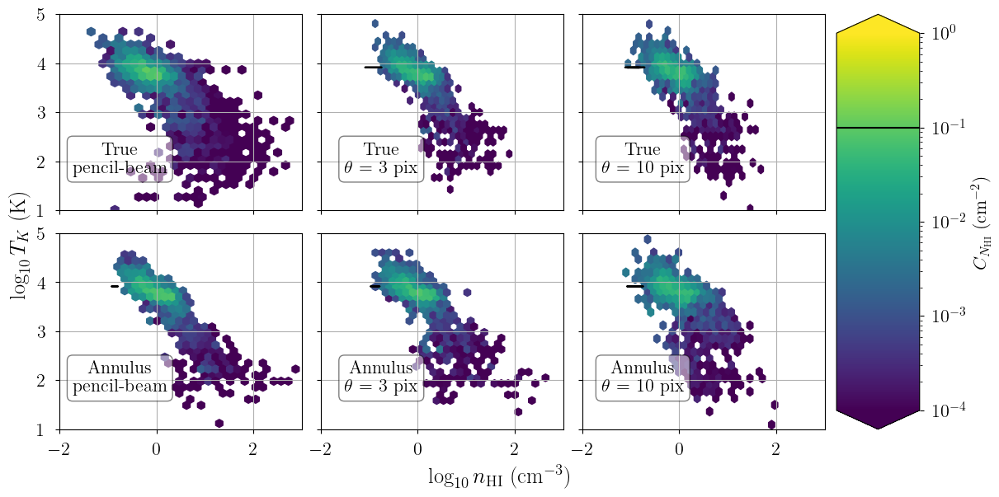

In [41]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative2D,
    "parameter",
    [caribou_hi_results, tigress_results],
    ["caribou_hi", "tigress"],
    params = ["log10_nHI_tau", "log10_tkin_tau"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    ylabel=r"$\log_{10} T_K$ (K)",
    xlim=(-2.0, 3.0),
    ylim=(1.0, 5.0),
    equal_line=False,
    volume=True,
    label_loc="lower left",
    cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    vmin=1.0e-4,
    vmax=1.0,
    drop_sightlines=bad_caribou_sightlines,
    gridsize=25,
    contour_tigress=True,
    contour_levels=[0.1],
)

analysis_plots version 0.1


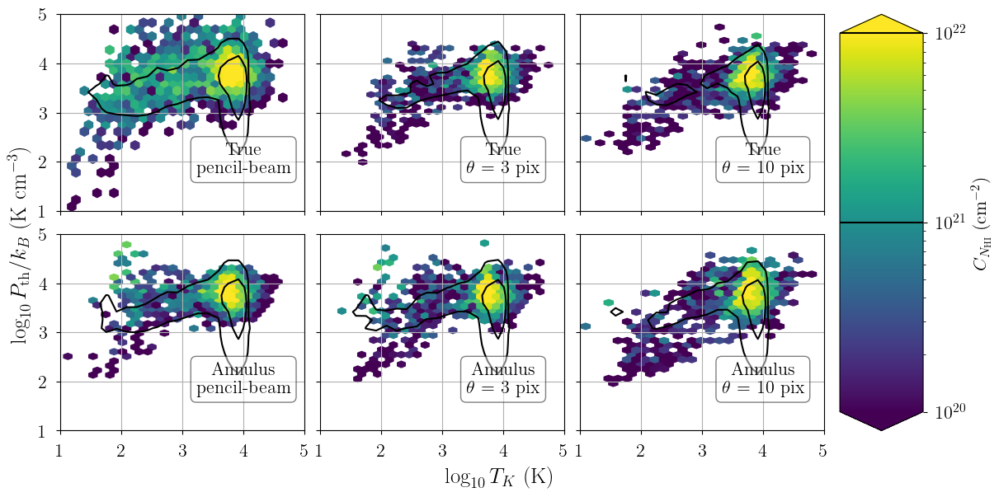

In [42]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative2D,
    "parameter",
    [caribou_hi_results, tigress_results],
    ["caribou_hi", "tigress"],
    params = ["log10_tkin_tau", "log10_pressure_tau"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} T_K$ (K)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    xlim=(1.0, 5.0),
    ylim=(1.0, 5.0),
    equal_line=False,
    volume=False,
    label_loc="lower right",
    cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    vmin=1.0e20,
    vmax=1.0e22,
    drop_sightlines=bad_caribou_sightlines,
    gridsize=25,
    contour_tigress=True,
    contour_levels=[1.0e21, 1e22],
)

analysis_plots version 0.1


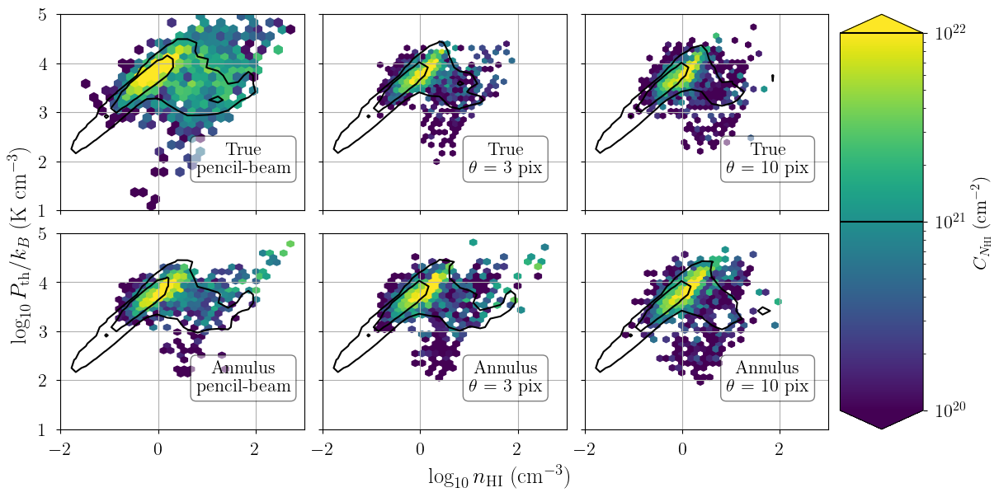

In [43]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative2D,
    "parameter",
    [caribou_hi_results, tigress_results],
    ["caribou_hi", "tigress"],
    params = ["log10_nHI_tau", "log10_pressure_tau"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    ylabel=r"$\log_{10} P_{\rm th}/k_B$ (K cm$^{-3}$)",
    xlim=(-2.0, 3.0),
    ylim=(1.0, 5.0),
    equal_line=False,
    volume=False,
    label_loc="lower right",
    cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    vmin=1.0e20,
    vmax=1.0e22,
    drop_sightlines=bad_caribou_sightlines,
    gridsize=25,
    contour_tigress=True,
    contour_levels=[1.0e21, 1e22],
)

analysis_plots version 0.1


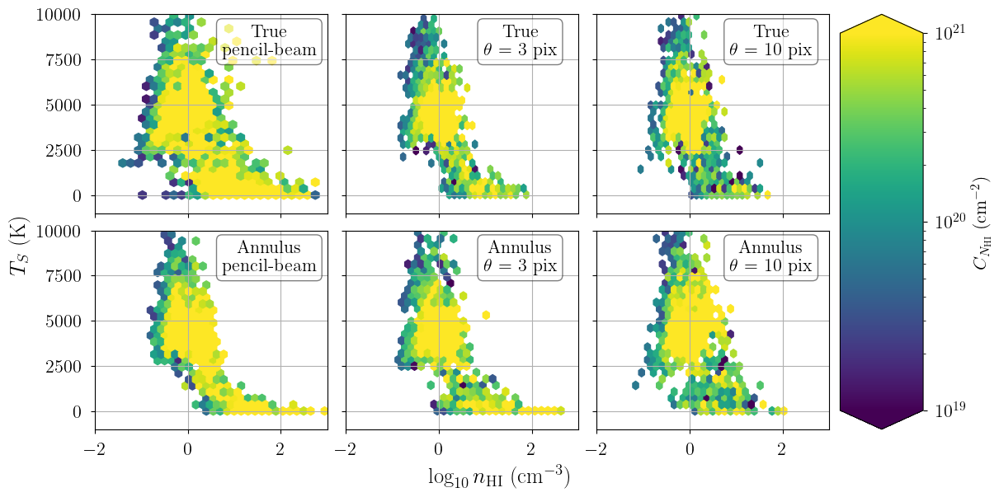

In [44]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative2D,
    "parameter",
    [caribou_hi_results],
    ["caribou_hi"],
    params = ["log10_nHI_tau", "tspin_tau"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} n_{\rm HI}$ (cm$^{-3}$)",
    ylabel=r"$T_S$ (K)",
    xlim=(-2.0, 3.0),
    ylim=(-1000.0, 10000.0),
    equal_line=False,
    volume=False,
    label_loc="upper right",
    cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    vmin=1.0e19,
    vmax=1.0e21,
    drop_sightlines=bad_caribou_sightlines,
    gridsize=25,
)

analysis_plots version 0.1


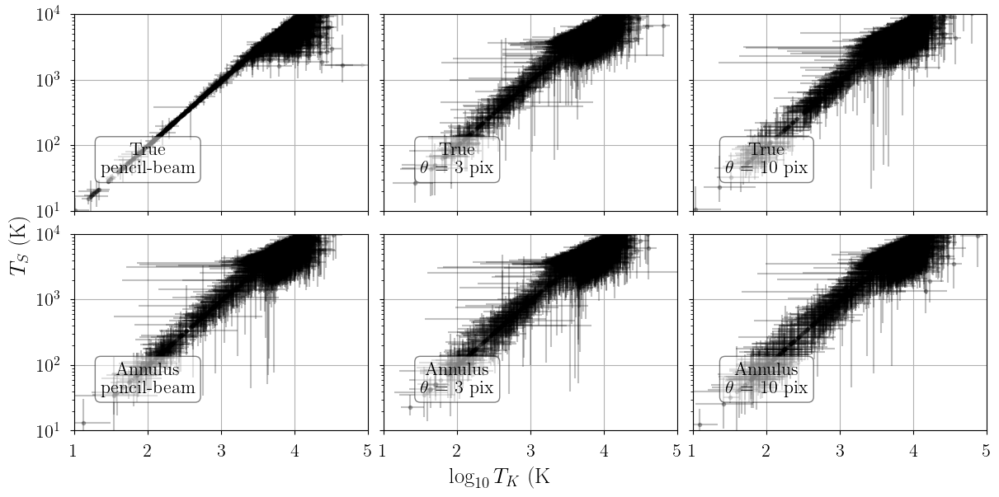

In [45]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [caribou_hi_results, caribou_hi_results],
    ["caribou_hi", "caribou_hi"],
    params = ["log10_tkin", "tspin"],
    #labels=[r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{\tau}$", r"$\langle$\texttt{TIGRESS-NCR}$\rangle_{T_B}$"],
    xlabel=r"$\log_{10} T_K$ (K",
    ylabel=r"$T_S$ (K)",
    xlim=(1.0, 5.0),
    ylim=(10.0, 10000.0),
    yscale="log",
    equal_line=False,
    #volume=False,
    label_loc="lower left",
    #cbar_label=r"$C_{N_{\rm HI}}$ (cm$^{-2}$)",
    #vmin=1.0e19,
    #vmax=1.0e21,
    drop_sightlines=bad_caribou_sightlines,
    #gridsize=25,
)

## Comparisons with `TIGRESS-NCR`

analysis_plots version 0.1


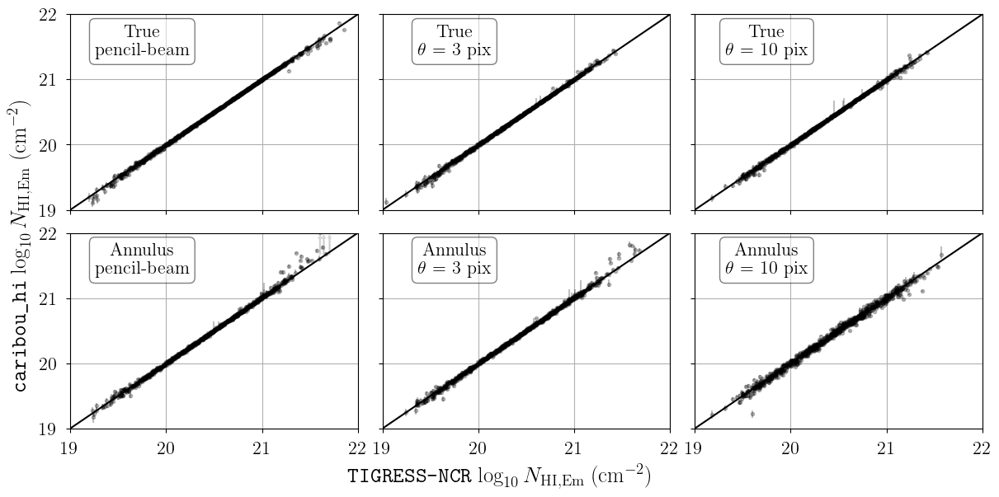

In [46]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["All_log10_NHI_TB", "All_log10_NHI_TB"],
    num_bins=0,
    xlabel=r"{\tt TIGRESS-NCR} $\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    ylabel=r"{\tt caribou_hi} $\log_{10} N_{\rm HI, Em}$ (cm$^{-2}$)",
    xlim=(19.0, 22.0),
    ylim=(19.0, 22.0),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


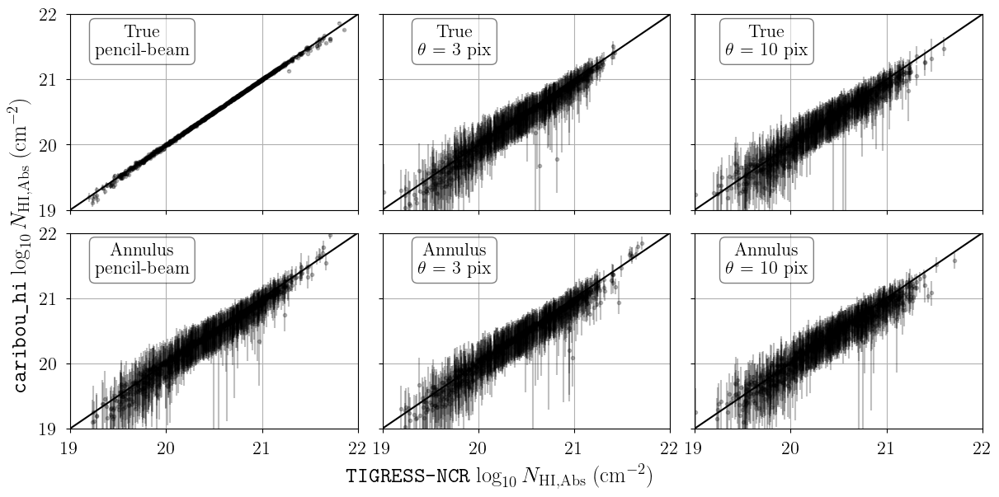

In [47]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["All_log10_NHI_tau", "All_log10_NHI_tau"],
    num_bins=0,
    xlabel=r"{\tt TIGRESS-NCR} $\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    ylabel=r"{\tt caribou_hi} $\log_{10} N_{\rm HI, Abs}$ (cm$^{-2}$)",
    xlim=(19.0, 22.0),
    ylim=(19.0, 22.0),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


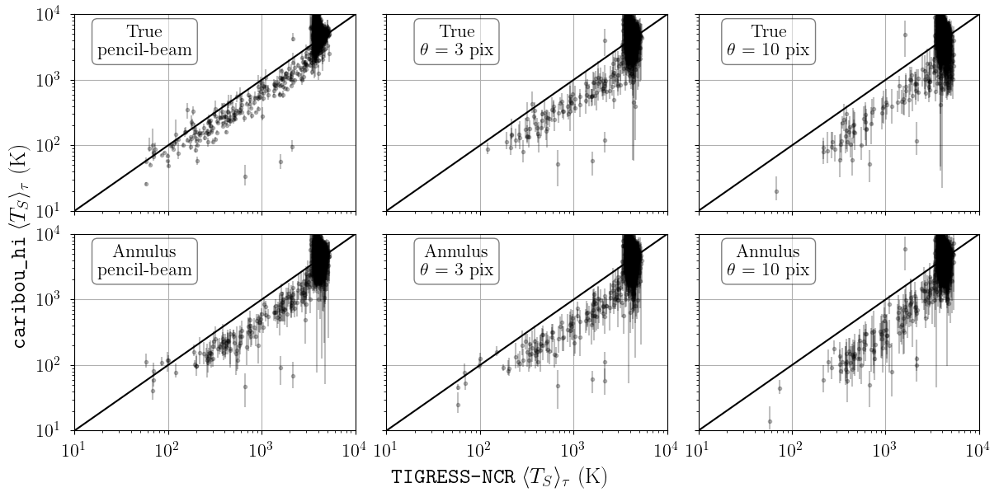

In [48]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["tau_weighted_tspin", "tau_weighted_tspin_tau"],
    num_bins=0,
    xlabel=r"{\tt TIGRESS-NCR} $\langle T_{S}\rangle_\tau$ (K)",
    ylabel=r"{\tt caribou_hi} $\langle T_{S}\rangle_\tau$ (K)",
    xlim=(10.0, 10000.0),
    ylim=(10.0, 10000.0),
    xscale="log",
    yscale="log",
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


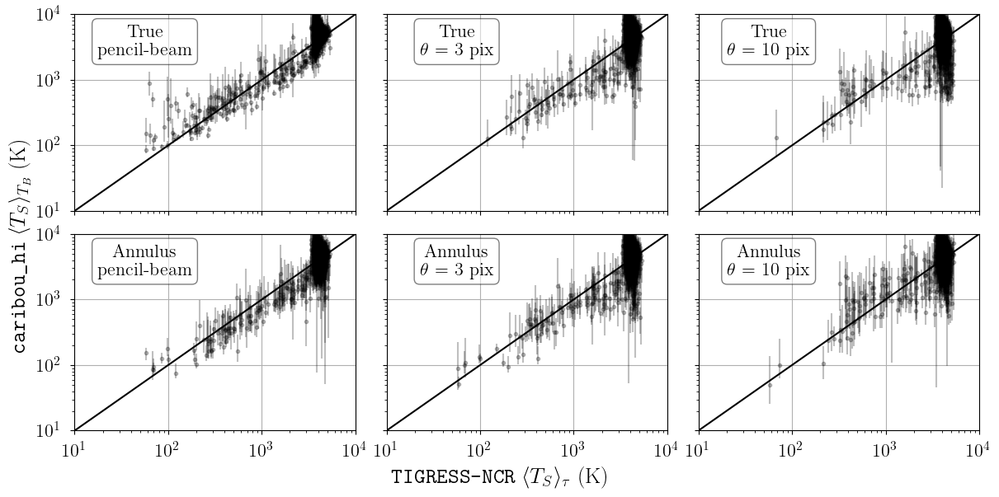

In [49]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["tau_weighted_tspin", "tau_weighted_tspin_TB"],
    num_bins=0,
    xlabel=r"{\tt TIGRESS-NCR} $\langle T_{S}\rangle_\tau$ (K)",
    ylabel=r"{\tt caribou_hi} $\langle T_{S}\rangle_{T_B}$ (K)",
    xlim=(10.0, 10000.0),
    ylim=(10.0, 10000.0),
    xscale="log",
    yscale="log",
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


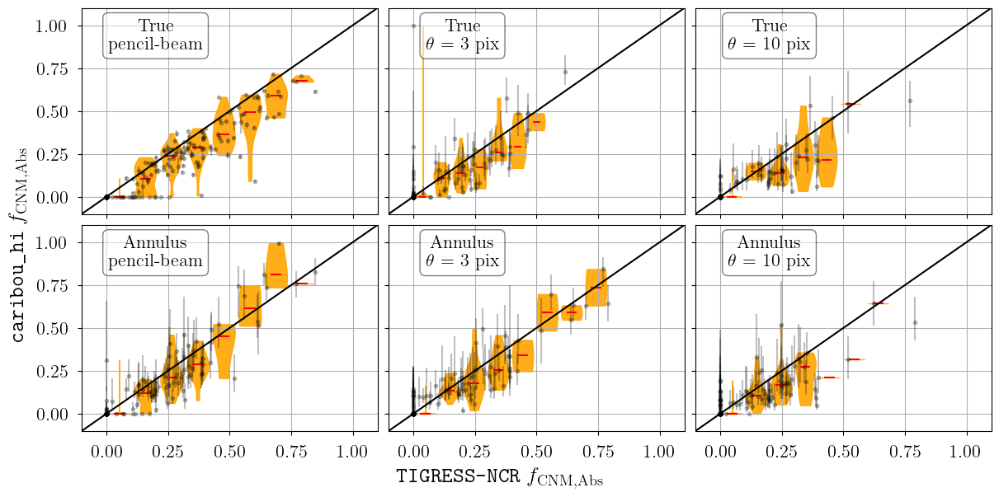

In [50]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["CNM_fraction_tau", "CNM_fraction_tau"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm CNM, Abs}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm CNM, Abs}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


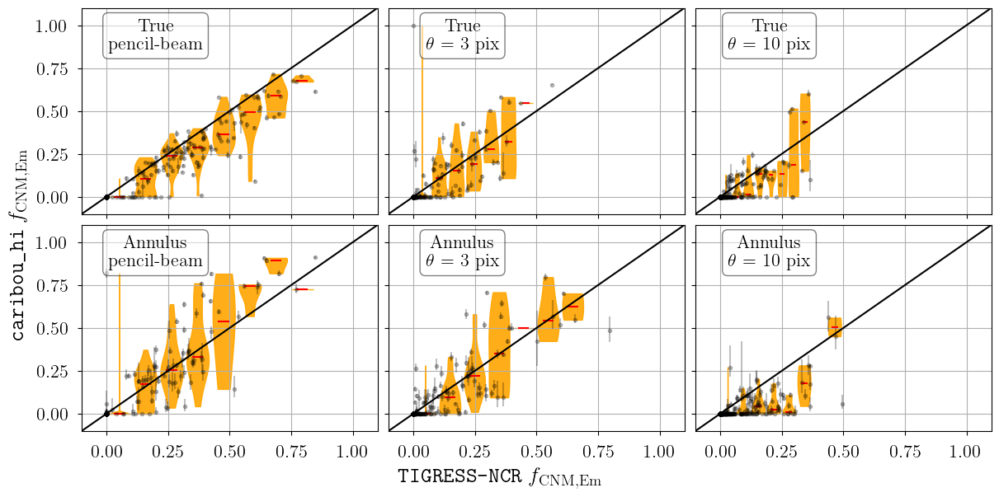

In [51]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["CNM_fraction_TB", "CNM_fraction_TB"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm CNM, Em}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm CNM, Em}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


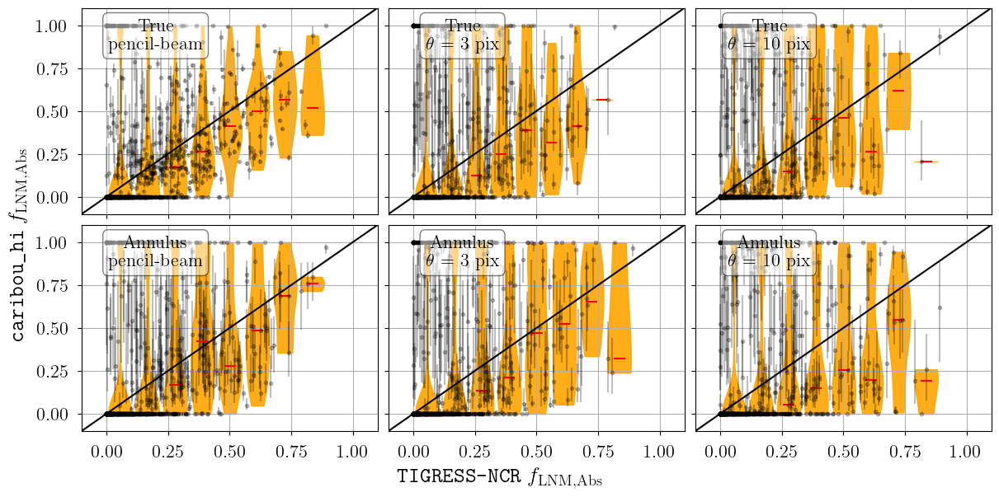

In [52]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["LNM_fraction_tau", "LNM_fraction_tau"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm LNM, Abs}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm LNM, Abs}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


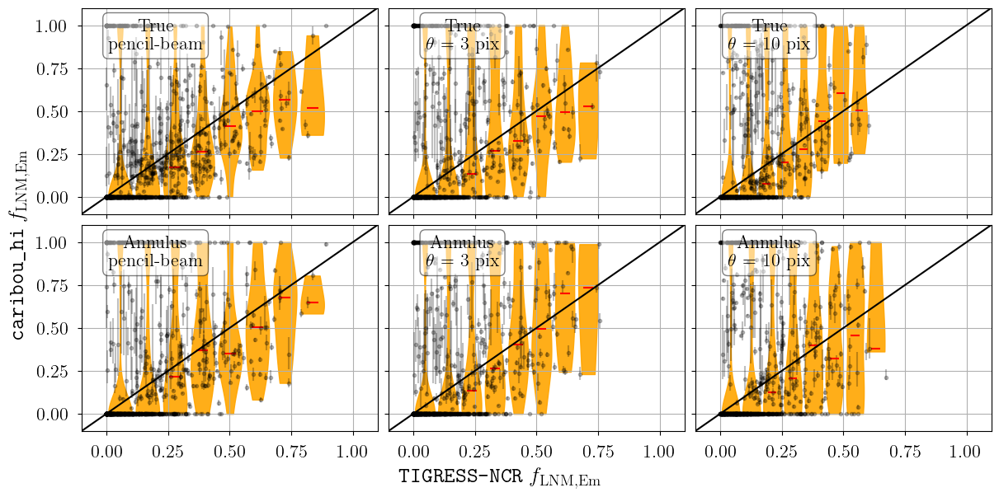

In [53]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["LNM_fraction_TB", "LNM_fraction_TB"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm LNM, Em}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm LNM, Em}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


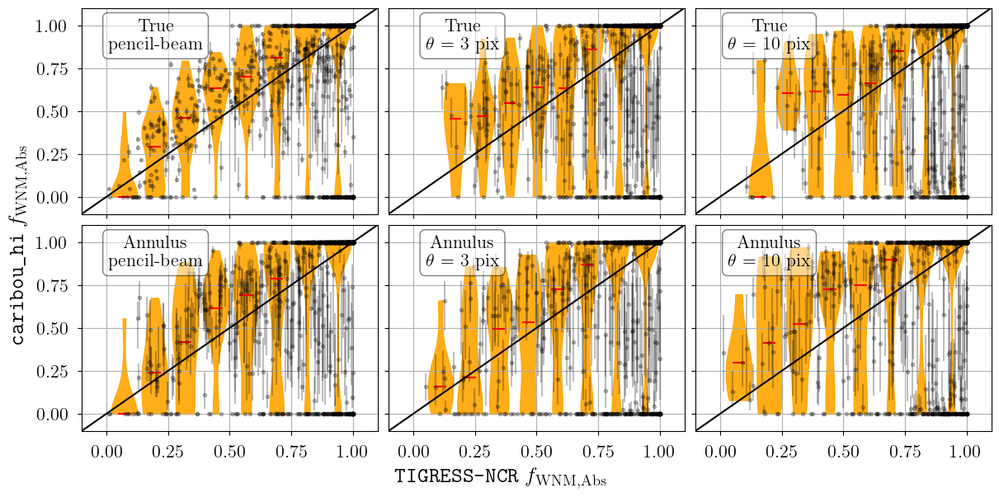

In [54]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["WNM_fraction_tau", "WNM_fraction_tau"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm WNM, Abs}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm WNM, Abs}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1


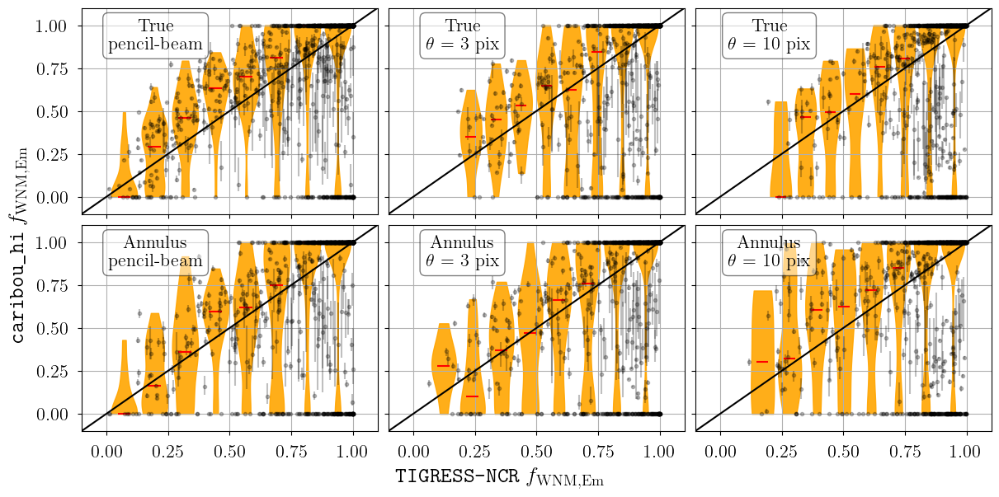

In [55]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Scatter,
    "parameter",
    [tigress_results, caribou_hi_results],
    ["tigress", "caribou_hi"],
    params = ["WNM_fraction_TB", "WNM_fraction_TB"],
    num_bins=8,
    xlabel=r"{\tt TIGRESS-NCR} $f_{\rm WNM, Em}$",
    ylabel=r"{\tt caribou_hi} $f_{\rm WNM, Em}$",
    xlim=(-0.1, 1.1),
    ylim=(-0.1, 1.1),
    equal_line=True,
    label_loc="upper left",
    drop_sightlines=bad_caribou_sightlines,
)

analysis_plots version 0.1
317


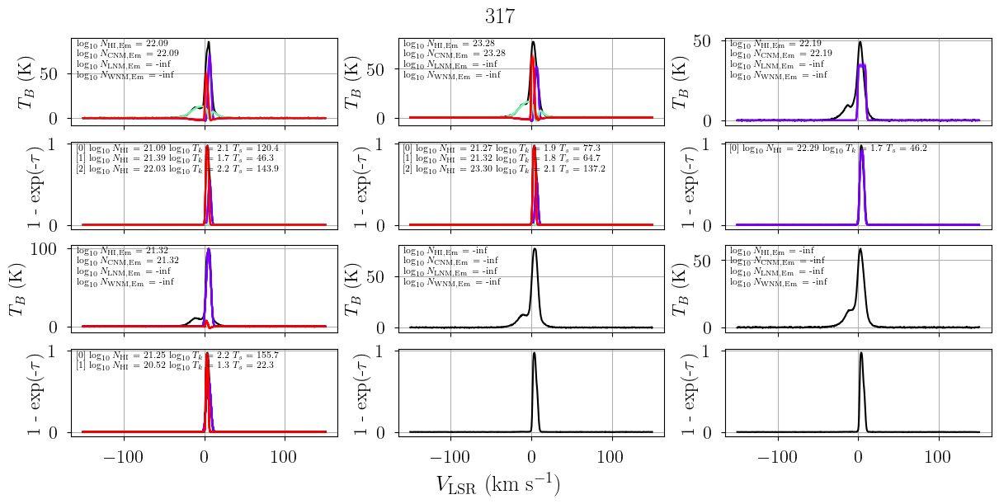

In [56]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

idx = np.random.choice(len(synth_data["mismatched"][1]["data_list"]))
while synth_data["mismatched"][1]["data_list"][idx].max() < 0.01:
    idx = np.random.choice(len(synth_data["mismatched"][1]["data_list"]))
print(idx)

fig = analysis_plots.plot_spectra(
    synth_data,
    caribou_hi_results,
    "caribou_hi",
    idx,
)

analysis_plots version 0.1


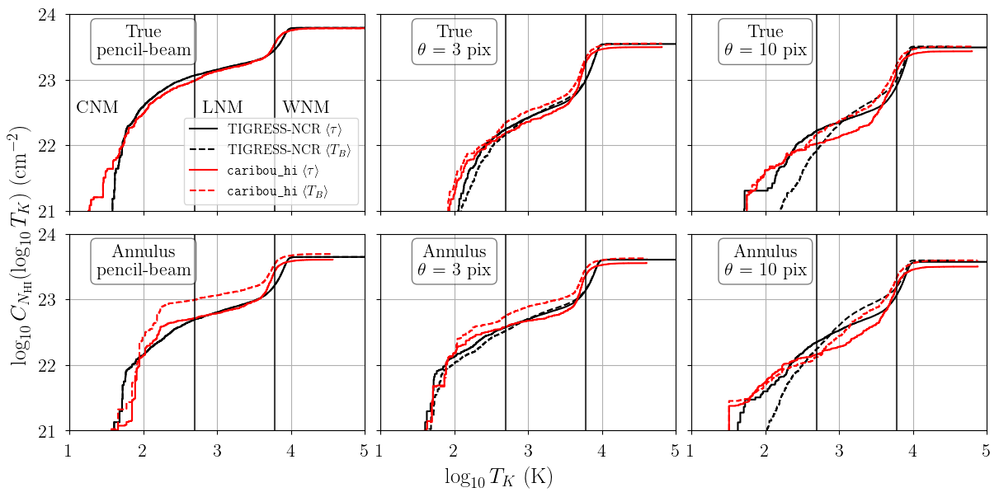

In [57]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative,
    "parameter",
    [tigress_results, tigress_results, caribou_hi_results, caribou_hi_results],
    ["tigress", "tigress", "caribou_hi", "caribou_hi"],
    params = ["log10_tkin_tau", "log10_tkin_TB", "log10_tkin_tau", "log10_tkin_TB"],
    labels=[r"TIGRESS-NCR $\langle \tau\rangle$", r"TIGRESS-NCR $\langle T_B\rangle$",
            r"\texttt{caribou_hi} $\langle \tau\rangle$", r"\texttt{caribou_hi} $\langle T_B\rangle$"],
    xlabel=r"$\log_{10} T_K$ (K)",
    ylabel=r"$\log_{10} C_{N_{\rm HI}}(\log_{10} T_K)$ (cm$^{-2}$)",
    xlim=(1.0, 5.0),
    ylim=(21.0, 24.0),
    equal_line=False,
    label_loc="upper left",
    num_samples=0,
    drop_sightlines = bad_caribou_sightlines,
    vlines=[1.0, np.log10(500.0), np.log10(6000.0)],
    vline_labels=["CNM", "LNM", "WNM"],
    vline_label_offset = 0.1,
)

analysis_plots version 0.1


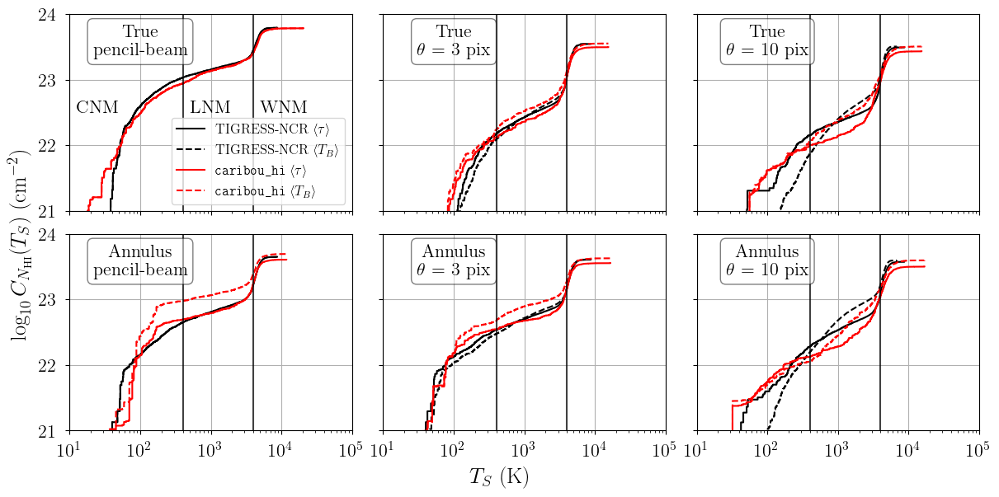

In [58]:
from scripts import analysis_plots
import importlib
importlib.reload(analysis_plots)

fig = analysis_plots.plot_grid(
    analysis_plots.Cumulative,
    "parameter",
    [tigress_results, tigress_results, caribou_hi_results, caribou_hi_results],
    ["tigress", "tigress", "caribou_hi", "caribou_hi"],
    params = ["tspin_tau", "tspin_TB", "tspin_tau", "tspin_TB"],
    labels=[r"TIGRESS-NCR $\langle \tau\rangle$", r"TIGRESS-NCR $\langle T_B\rangle$",
            r"\texttt{caribou_hi} $\langle \tau\rangle$", r"\texttt{caribou_hi} $\langle T_B\rangle$"],
    xlabel=r"$T_S$ (K)",
    ylabel=r"$\log_{10} C_{N_{\rm HI}}(T_S)$ (cm$^{-2}$)",
    xlim=(10.0, 100000.0),
    ylim=(21.0, 24.0),
    xscale="log",
    equal_line=False,
    label_loc="upper left",
    num_samples=0,
    drop_sightlines = bad_caribou_sightlines,
    vlines=[10.0, 400.0, 4000.0],
    vline_labels=["CNM", "LNM", "WNM"],
    vline_label_offset = 1.25,
)